In [2]:
import numpy as np
import pandas as pd 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py

/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method

In [ ]:
import mlflow
mlflow.start_run()
mlflow.end_run()

In [11]:
df=pd.read_csv("blender-efficiency (1).csv")
df

,BlendingEfficiency,MixerDiameter,MixerRotation,BlendingTime,ParticleSize
0,84.5,4,200,60,2
1,62.9,4,200,60,8
2,90.7,8,200,60,2
3,63.2,8,200,60,8
4,70.9,6,175,45,5
5,69.2,6,225,45,5
6,80.1,6,175,75,5
7,79.8,6,225,45,5
8,75.1,6,200,60,5
9,81.8,6,200,45,2


In [12]:
from doepy import build
df_2=build.full_fact(
{'BlendingEfficiency':df["BlendingEfficiency"].values,
'MixerDiameter':df["MixerDiameter"].values,
'BlendingTime':df["BlendingTime"].values,
'ParticleSize':df["ParticleSize"].values}
)

In [13]:
df_2

,BlendingEfficiency,MixerDiameter,BlendingTime,ParticleSize
0,84.500000,4.0,60.0,2.0
1,62.900002,4.0,60.0,2.0
2,90.699997,4.0,60.0,2.0
3,63.200001,4.0,60.0,2.0
4,70.900002,4.0,60.0,2.0
...,...,...,...,...
104971,72.400002,6.0,60.0,5.0
104972,76.400002,6.0,60.0,5.0
104973,71.900002,6.0,60.0,5.0
104974,74.900002,6.0,60.0,5.0


In [24]:
x = df_2[['BlendingEfficiency','MixerDiameter','ParticleSize']].values

In [27]:
model = KMeans(n_clusters = 3, init = "k-means++", max_iter = 300, n_init = 10, random_state = 0)
y_clusters = model.fit_predict(x)

/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:445: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/srv/conda/envs/notebook/lib/python3.7/site-packages/sklearn/cluster/k_means_.py:445: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release n

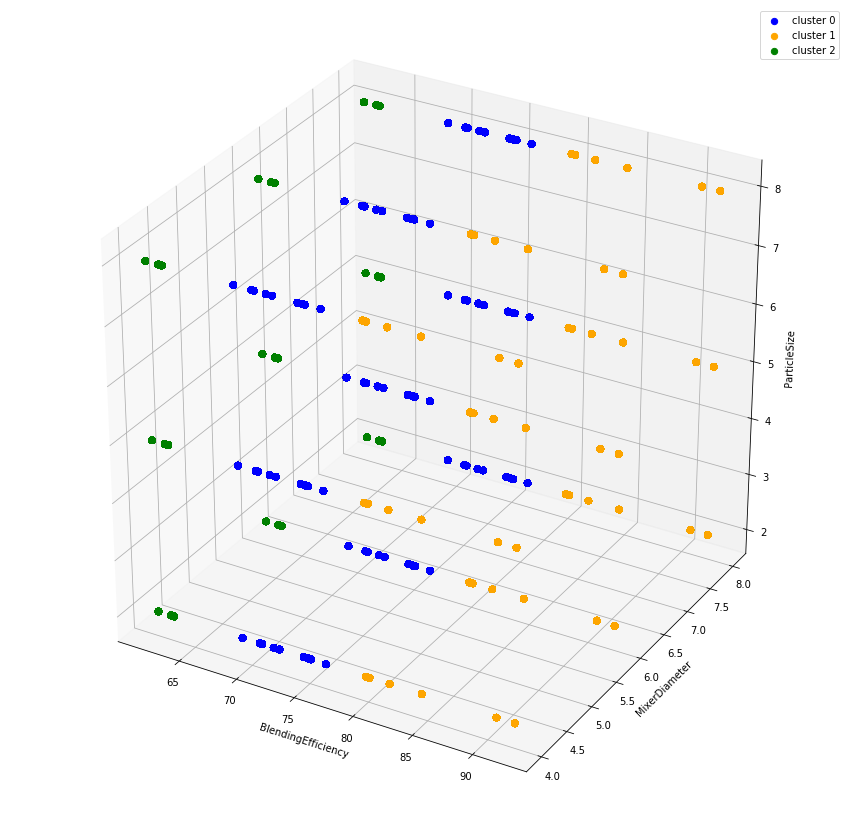

In [28]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x[y_clusters == 0,0],x[y_clusters == 0,1],x[y_clusters == 0,2], s = 40 , color = 'blue', label = "cluster 0")
ax.scatter(x[y_clusters == 1,0],x[y_clusters == 1,1],x[y_clusters == 1,2], s = 40 , color = 'orange', label = "cluster 1")
ax.scatter(x[y_clusters == 2,0],x[y_clusters == 2,1],x[y_clusters == 2,2], s = 40 , color = 'green', label = "cluster 2")

ax.set_xlabel('BlendingEfficiency')
ax.set_ylabel('MixerDiameter')
ax.set_zlabel('ParticleSize')
ax.legend()
plt.show()
plt.savefig('cluster.png')

In [31]:
Scene = dict(xaxis = dict(title  = 'BlendingEfficiency'),yaxis = dict(title  = 'MixingDiameter'),zaxis = dict(title  = 'ParticleSize'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = model.labels_
trace = go.Scatter3d(x=x[:, 0], y=x[:, 1], z=x[:, 2], mode='markers',marker=dict(color = labels, size= 10, line=dict(color= 'black',width = 10)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [32]:
import plotly.express as px
fig.write_html("file.html")

In [ ]:
mlflow.start_run(run_name = 'doe')
mlflow.log_artifact('file.html')
mlflow.log_artifact('cluster.png')
mlflow.end_run()